<a href="https://colab.research.google.com/github/rajaboja/learnings/blob/master/Basic_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
import torch.nn as nn
from torchvision import transforms
from tqdm.auto import tqdm
from torchvision.utils import make_grid
import matplotlib.pyplot as plt

In [2]:
def get_generator_block(in_dim,out_dim):
    return nn.Sequential(
        nn.Linear(in_dim,out_dim),
        nn.BatchNorm1d(out_dim),
        nn.ReLU(inplace=True)
    )

In [3]:
class Generator(nn.Module):
    def __init__(self,z_dim,im_dim=784,hid_dim=128):
        super().__init__()
        self.gen = nn.Sequential(
            get_generator_block(z_dim,hid_dim),
            get_generator_block(hid_dim,2*hid_dim),
            get_generator_block(2*hid_dim,4*hid_dim),
            get_generator_block(4*hid_dim,8*hid_dim),
            nn.Linear(8*hid_dim,im_dim),
            nn.Sigmoid()
        )
    def forward(self,x):
        return self.gen(x)

    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [4]:
def get_noise(n_samples,z_dim,device):
    return torch.randn((n_samples,z_dim),device=device)

In [5]:
def get_discriminator(in_dim,out_dim):
    return nn.Sequential(nn.Linear(in_dim,out_dim),
                         nn.LeakyReLU(negative_slope=0.2))

In [6]:
class Discriminator(nn.Module):
    def __init__(self,im_dim=784,hid_dim=128):
        super().__init__()
        self.disc = nn.Sequential(
            get_discriminator(im_dim,4*hid_dim),
            get_discriminator(4*hid_dim,2*hid_dim),
            get_discriminator(2*hid_dim,hid_dim),
            nn.Linear(hid_dim,1)
        )
    def forward(self,x):
        return self.disc(x)


In [7]:
loss = nn.BCEWithLogitsLoss()
z_dim=64
bs=128
n_epochs=200
lr= 1e-3
if torch.cuda.is_available(): device='cuda' 
else: device='cpu'

In [8]:
from torchvision.datasets import MNIST
dls = torch.utils.data.DataLoader(MNIST('.',transform=transforms.ToTensor(),download=True),
                                  batch_size=bs,shuffle=True)


Failed to download (trying next):
HTTP Error 503: Service Unavailable




Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 503: Service Unavailable




Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 503: Service Unavailable




Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 503: Service Unavailable




Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw

Processing...
Done!


/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:502: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:143.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [9]:
# next(iter(dls))

In [10]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters())

disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters())

In [11]:
def get_disc_loss(gen,disc,num_images,real,z_dim,device):
    gen_out = gen(get_noise(num_images,z_dim,device)).detach()

    preds_fake = disc(gen_out)
    targ_fake = torch.zeros_like(preds_fake)
    loss_fake = loss(preds_fake,targ_fake)

    preds_real = disc(real)
    targ_real = torch.ones_like(preds_real)
    loss_real = loss(preds_real,targ_real)
    return (loss_fake+loss_real)/2

In [12]:
def get_gen_loss(gen,disc,num_images,z_dim,device):
    gen_out = gen(get_noise(num_images,z_dim,device))
    preds = disc(gen_out)
    targs = torch.ones_like(preds)
    return loss(preds,targs)

In [13]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
'
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

Step 500: Generator loss: 7.7849167212247785, discriminator loss: 0.19579733578907313


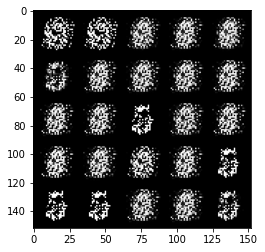

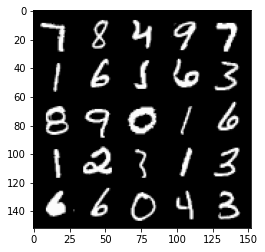

Step 1000: Generator loss: 18.521778322100644, discriminator loss: 0.21659405807289278


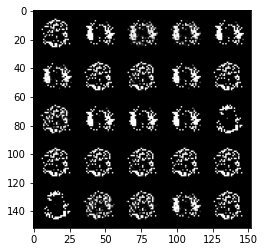

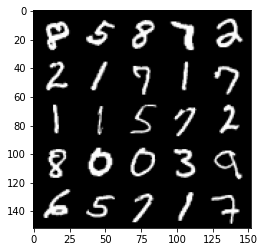

Step 1500: Generator loss: 30.2272539604902, discriminator loss: 0.24374429343374493


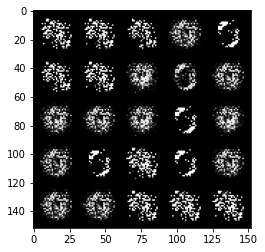

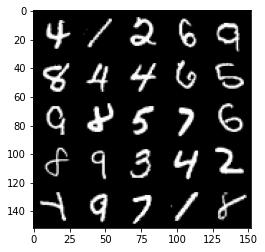

Step 2000: Generator loss: 41.729982986330945, discriminator loss: 0.2794164028322704


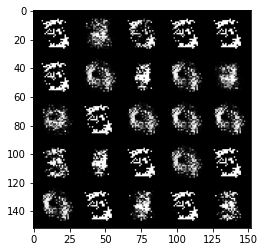

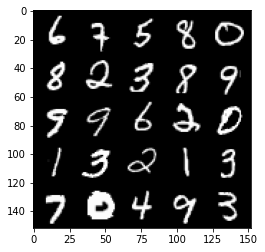

Step 2500: Generator loss: 49.862875659823374, discriminator loss: 0.34318677274150816


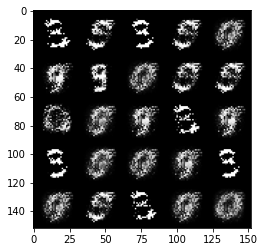

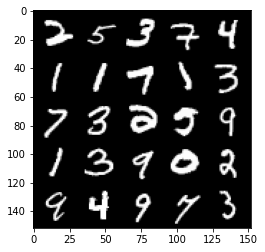

Step 3000: Generator loss: 59.89581953704364, discriminator loss: 0.41507352875325826


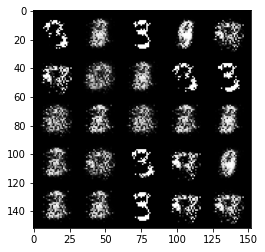

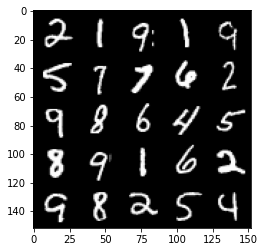

Step 3500: Generator loss: 68.08519799506671, discriminator loss: 0.5020313559967464


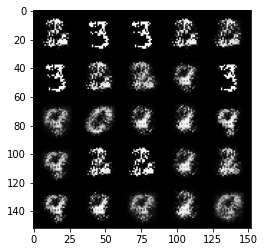

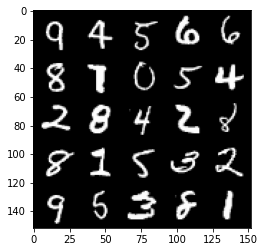

Step 4000: Generator loss: 74.62804537475114, discriminator loss: 0.5891579635563657


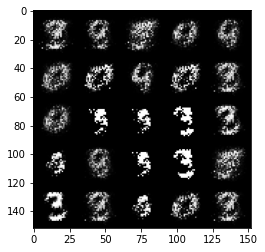

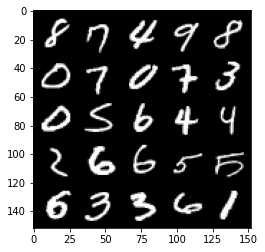

Step 4500: Generator loss: 81.12228684985652, discriminator loss: 0.688549003468023


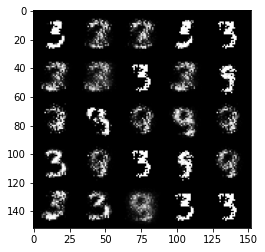

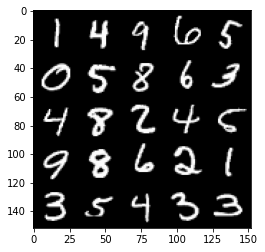

Step 5000: Generator loss: 89.42181881177454, discriminator loss: 0.7900189357317411


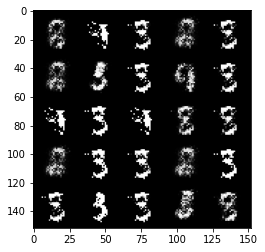

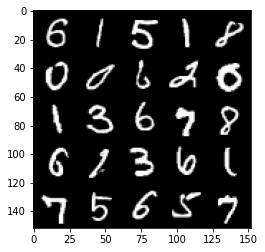

Step 5500: Generator loss: 95.64050154101862, discriminator loss: 0.8928839942842159


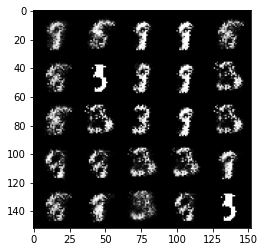

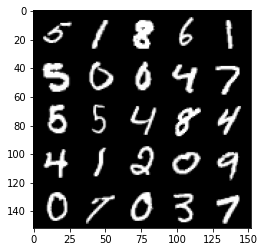

Step 6000: Generator loss: 101.96785141170027, discriminator loss: 0.9974576548478931


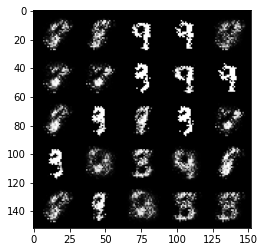

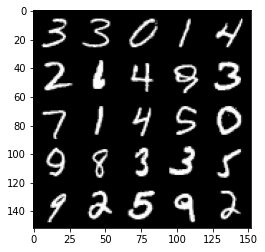

Step 6500: Generator loss: 107.97756837975972, discriminator loss: 1.1016185273222059


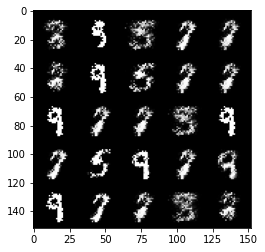

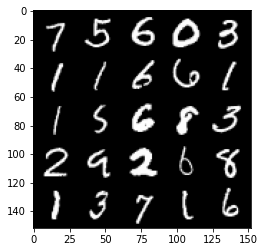

Step 7000: Generator loss: 113.6755672286748, discriminator loss: 1.2042955795164596


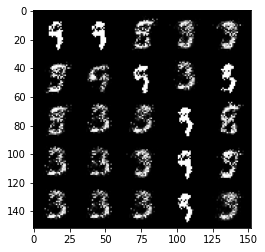

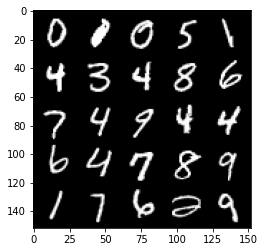

Step 7500: Generator loss: 118.68083031404018, discriminator loss: 1.3425381000052596


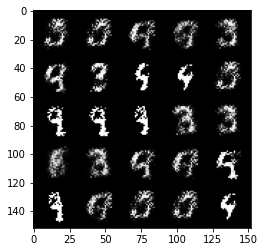

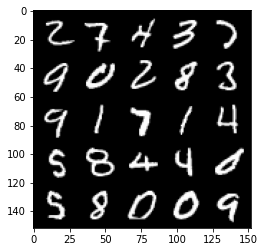

Step 8000: Generator loss: 124.6734084504842, discriminator loss: 1.4908193677711696


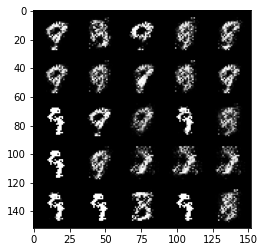

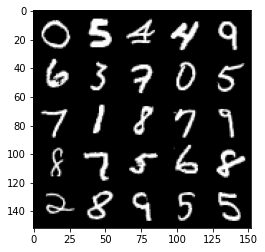

Step 8500: Generator loss: 129.88549526917936, discriminator loss: 1.6446707770499804


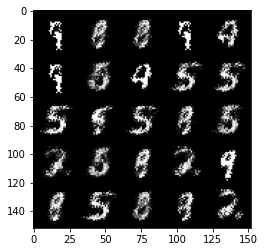

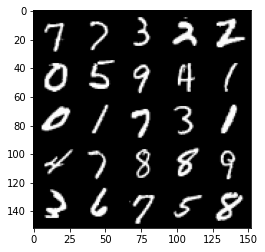

Step 9000: Generator loss: 135.10478358495197, discriminator loss: 1.800541142885705


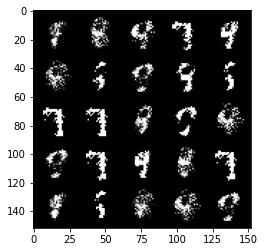

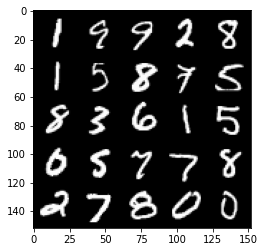

Step 9500: Generator loss: 139.72553529918156, discriminator loss: 1.952355839585086


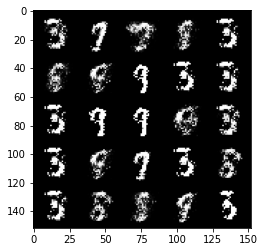

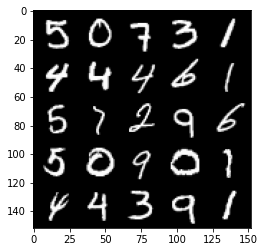

Step 10000: Generator loss: 144.4723693097825, discriminator loss: 2.100441737969537


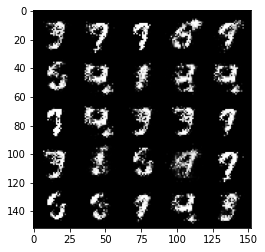

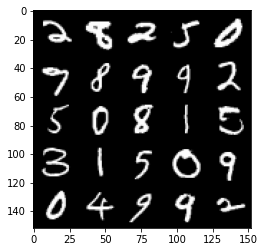

Step 10500: Generator loss: 149.4302942594283, discriminator loss: 2.2468238086934584


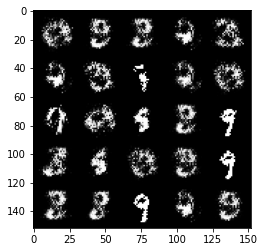

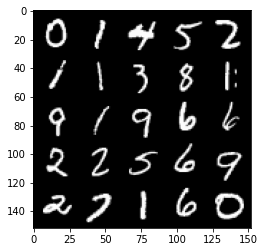

Step 11000: Generator loss: 154.63973046386198, discriminator loss: 2.3703599905903796


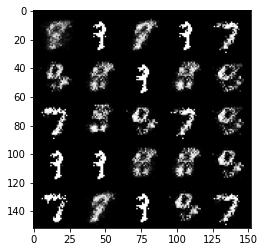

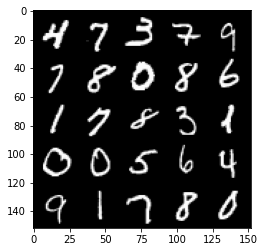

Step 11500: Generator loss: 159.97864784276456, discriminator loss: 2.510794755743016


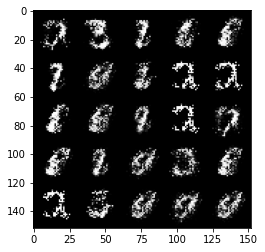

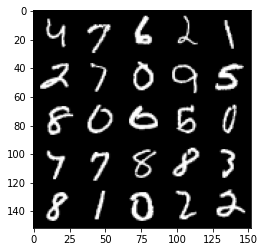

Step 12000: Generator loss: 164.57869439065408, discriminator loss: 2.6650977155651345


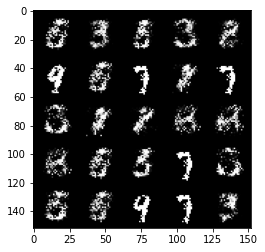

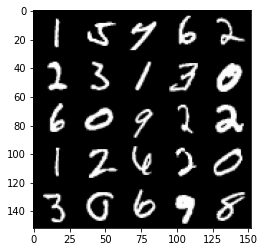

Step 12500: Generator loss: 169.51257043635812, discriminator loss: 2.830441727408341


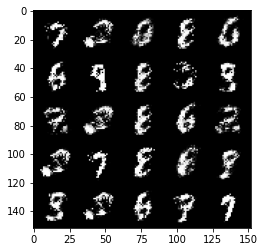

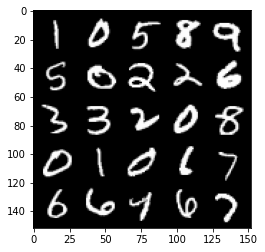

Step 13000: Generator loss: 173.87237330567783, discriminator loss: 3.0106970634173065


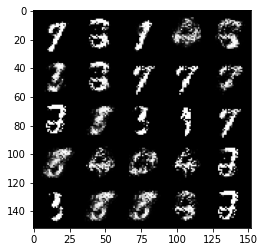

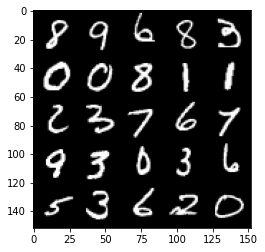

Step 13500: Generator loss: 178.1107333725684, discriminator loss: 3.1943845199506176


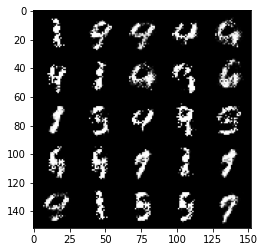

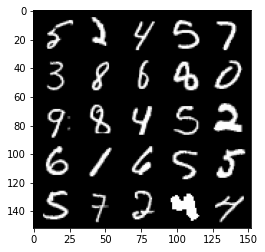

Step 14000: Generator loss: 182.81620379626676, discriminator loss: 3.3721434346299075


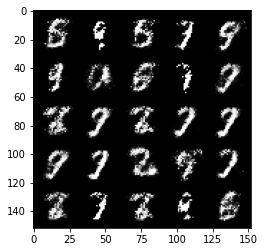

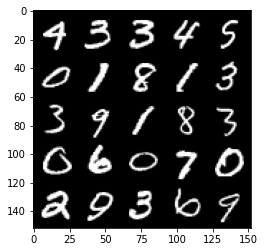

Step 14500: Generator loss: 186.6541124252074, discriminator loss: 3.5701178338240265


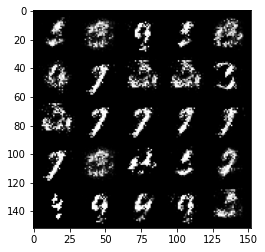

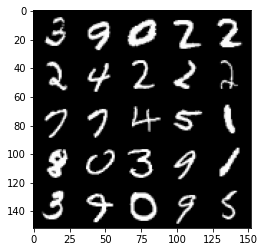

Step 15000: Generator loss: 191.1374031833403, discriminator loss: 3.7434061285938443


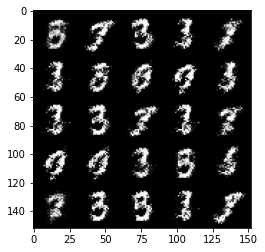

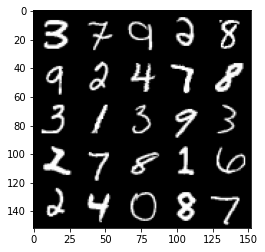

Step 15500: Generator loss: 195.251321586966, discriminator loss: 3.9357274842943375


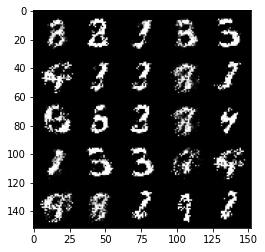

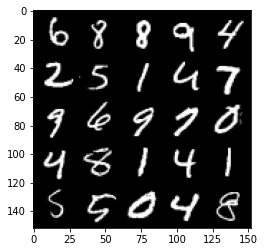

Step 16000: Generator loss: 199.5135743025536, discriminator loss: 4.124000779339235


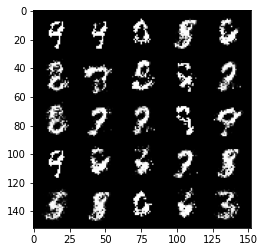

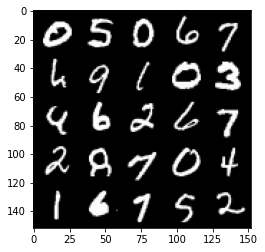

Step 16500: Generator loss: 203.54401099526865, discriminator loss: 4.3123153324808285


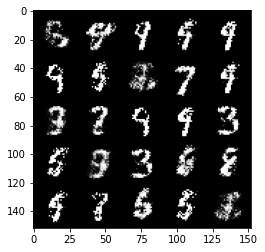

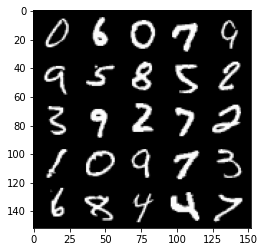

Step 17000: Generator loss: 207.81597808158367, discriminator loss: 4.493143322893539


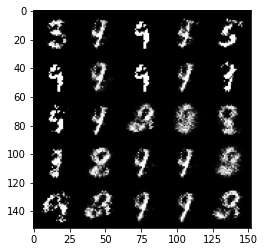

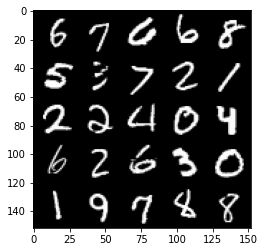

Step 17500: Generator loss: 211.77865832221443, discriminator loss: 4.6921498430456365


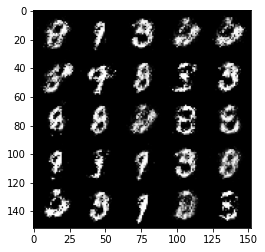

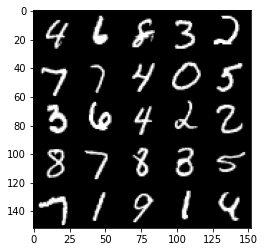

Step 18000: Generator loss: 215.92267228114542, discriminator loss: 4.878935836234254


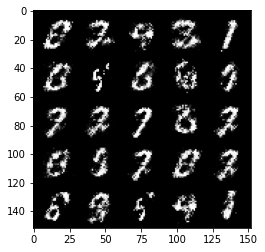

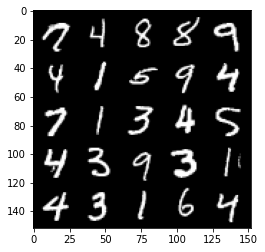

Step 18500: Generator loss: 219.93337193286357, discriminator loss: 5.057934964017137


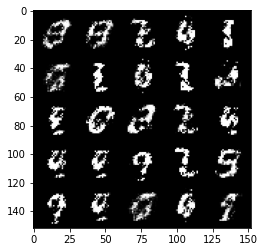

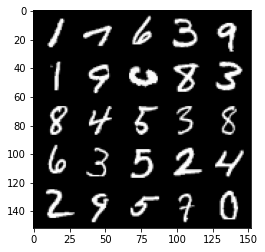

Step 19000: Generator loss: 224.0177953714129, discriminator loss: 5.2548068073402465


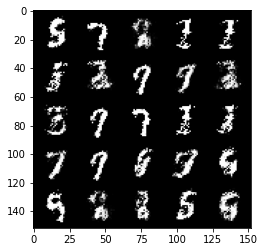

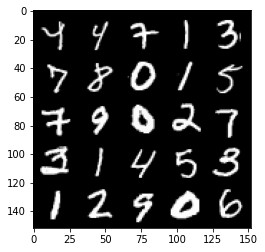

Step 19500: Generator loss: 228.09467839562868, discriminator loss: 5.439198956207495


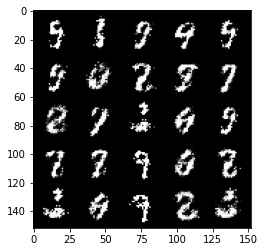

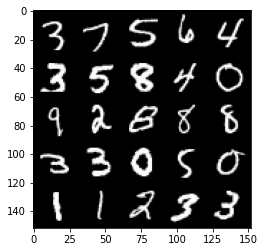

Step 20000: Generator loss: 231.8586372650857, discriminator loss: 5.644055974618652


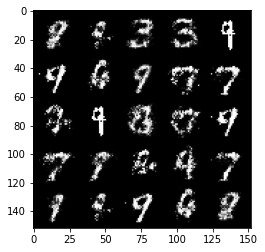

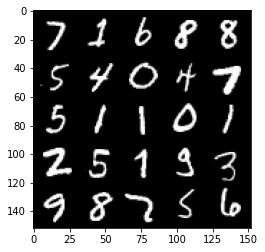

Step 20500: Generator loss: 235.78222818171935, discriminator loss: 5.828619033114172


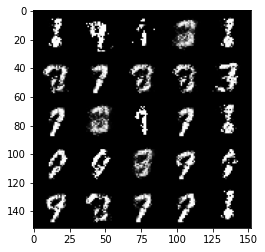

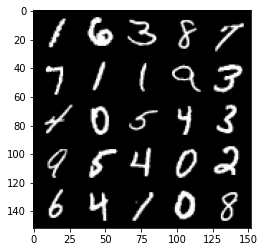

Step 21000: Generator loss: 239.53663441073846, discriminator loss: 6.037071036786887


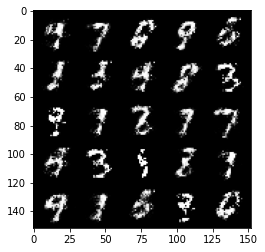

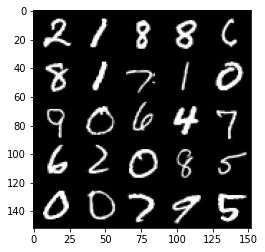

Step 21500: Generator loss: 243.07075476729835, discriminator loss: 6.258262124748084


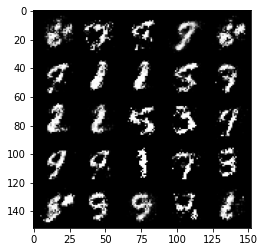

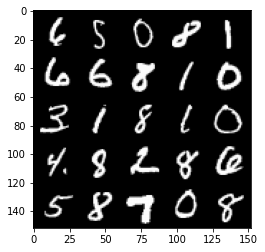

Step 22000: Generator loss: 246.64883643472177, discriminator loss: 6.4830154114674166


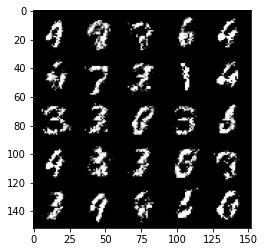

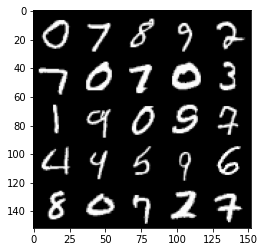

Step 22500: Generator loss: 250.05841911447018, discriminator loss: 6.718581843466623


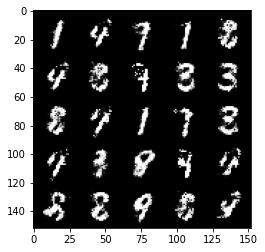

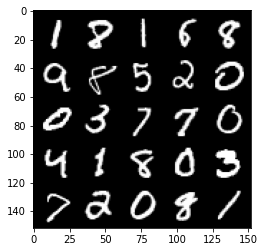

Step 23000: Generator loss: 253.17576818692632, discriminator loss: 6.966007942409389


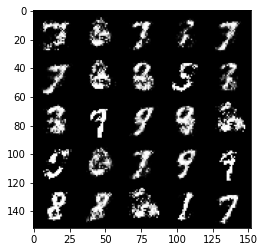

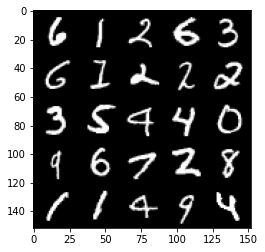

Step 23500: Generator loss: 256.3993567794553, discriminator loss: 7.212842563809021


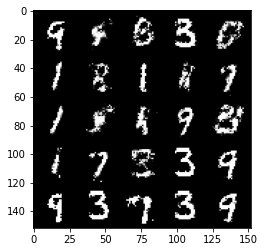

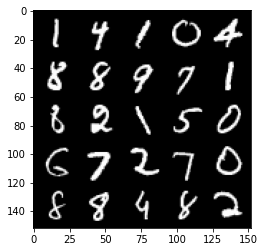

Step 24000: Generator loss: 259.5790614649054, discriminator loss: 7.456413144604424


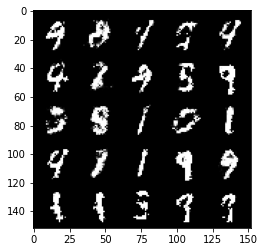

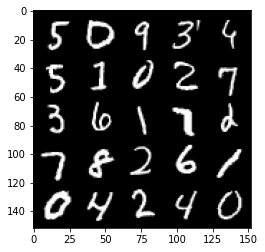

Step 24500: Generator loss: 263.0259374648328, discriminator loss: 7.668437963710283


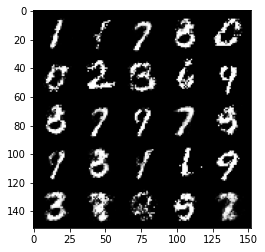

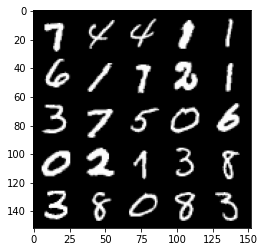

Step 25000: Generator loss: 266.3536162725686, discriminator loss: 7.881556582839337


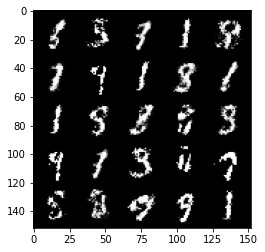

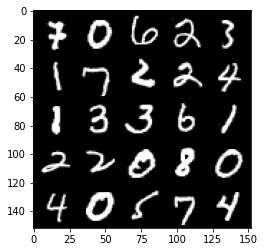

Step 25500: Generator loss: 269.5022289181948, discriminator loss: 8.120794040293546


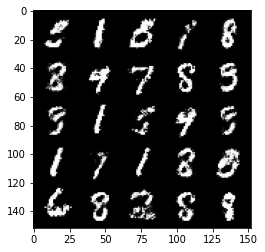

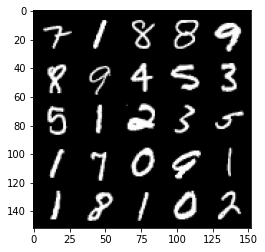

Step 26000: Generator loss: 272.95183117401535, discriminator loss: 8.32798357413815


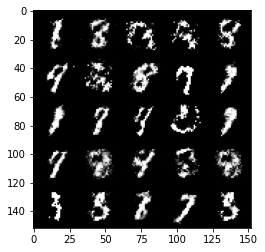

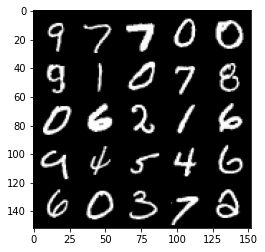

Step 26500: Generator loss: 276.4206162515867, discriminator loss: 8.541437089876382


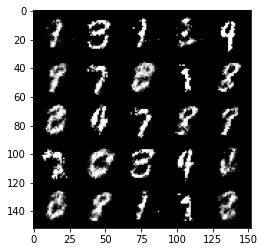

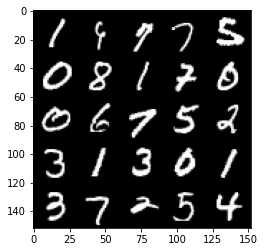

Step 27000: Generator loss: 279.90723530208965, discriminator loss: 8.763637735695703


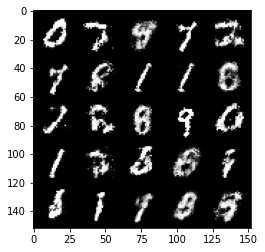

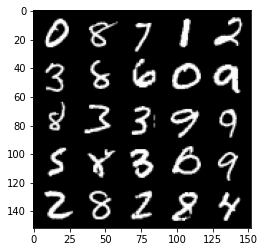

Step 27500: Generator loss: 283.1454012671695, discriminator loss: 8.993150687382672


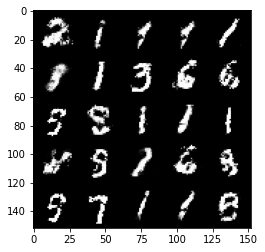

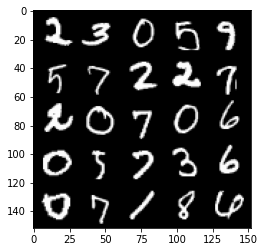

Step 28000: Generator loss: 286.40557038938806, discriminator loss: 9.215164717570985


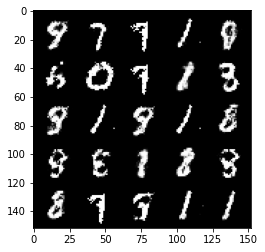

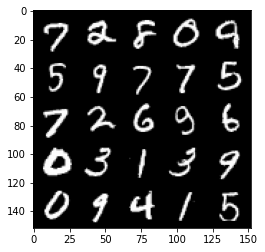

Step 28500: Generator loss: 289.46045722687035, discriminator loss: 9.446538616956323


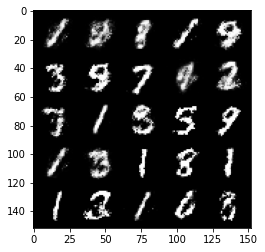

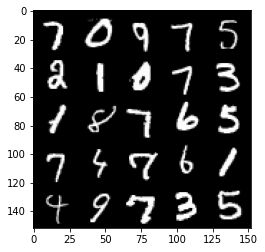

Step 29000: Generator loss: 292.5030041779256, discriminator loss: 9.678188349009595


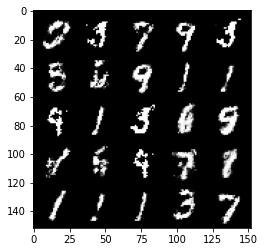

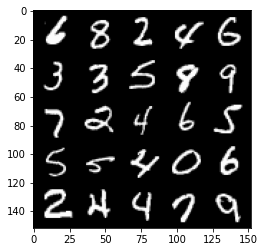

Step 29500: Generator loss: 295.4907357083532, discriminator loss: 9.925682503656594


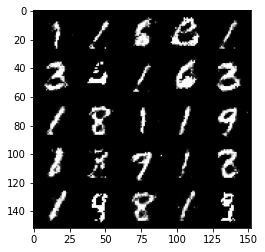

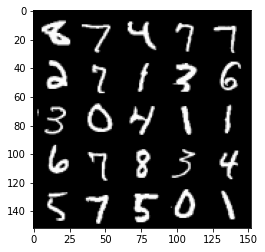

Step 30000: Generator loss: 298.316343742487, discriminator loss: 10.176847778723683


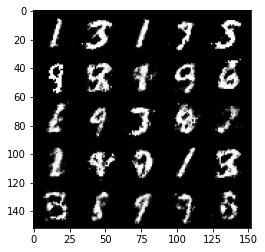

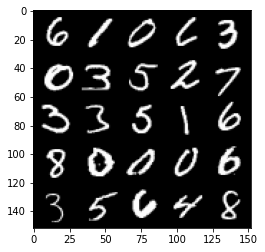

Step 30500: Generator loss: 301.22902665102174, discriminator loss: 10.408985983447277


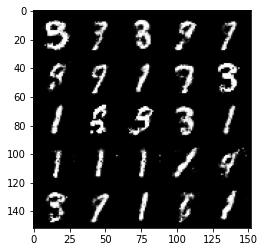

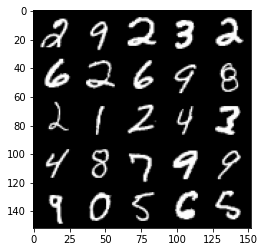

Step 31000: Generator loss: 304.1507840408054, discriminator loss: 10.644035649628494


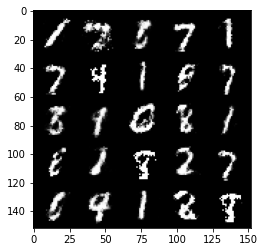

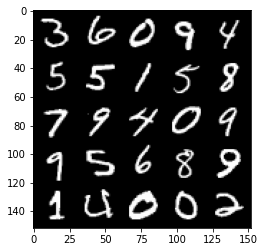

Step 31500: Generator loss: 306.87284482323764, discriminator loss: 10.89194854265555


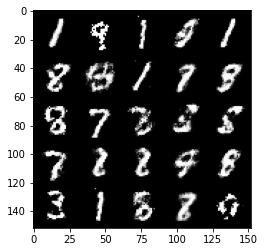

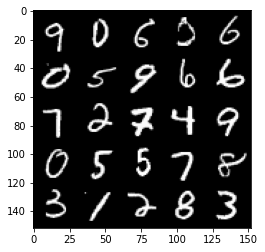

Step 32000: Generator loss: 309.6389247227873, discriminator loss: 11.146561753810479


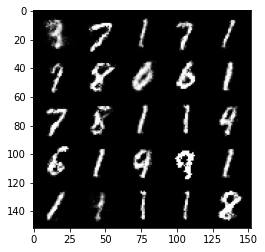

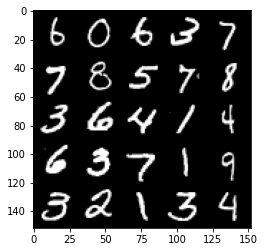

Step 32500: Generator loss: 312.2577454172331, discriminator loss: 11.407575441212485


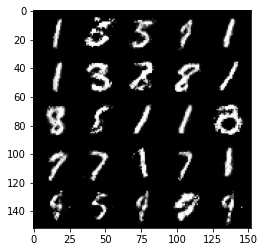

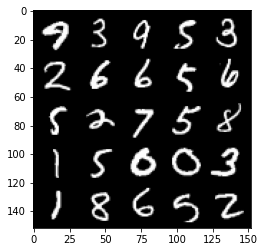

Step 33000: Generator loss: 314.82286705839215, discriminator loss: 11.674318561972221


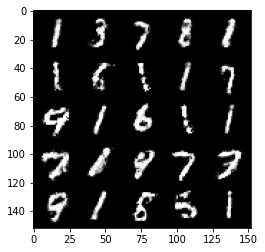

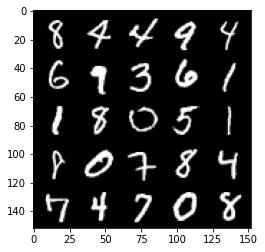

Step 33500: Generator loss: 317.32202457773275, discriminator loss: 11.937351470024414


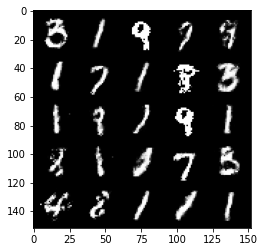

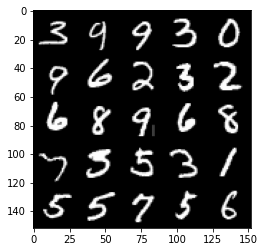

Step 34000: Generator loss: 319.9487239364338, discriminator loss: 12.18994883909922


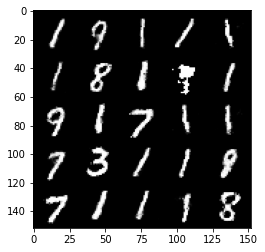

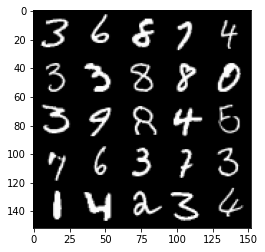

Step 34500: Generator loss: 322.4724567660038, discriminator loss: 12.450707908512179


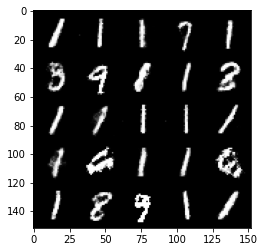

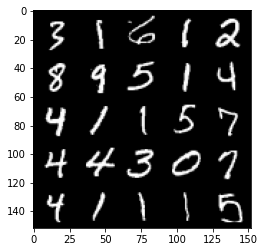

Step 35000: Generator loss: 324.92118121802235, discriminator loss: 12.720742082269004


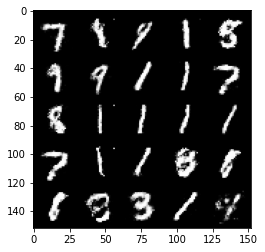

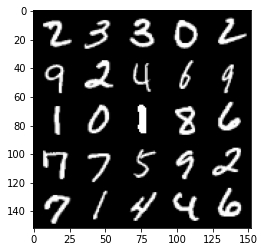

Step 35500: Generator loss: 327.2803151689713, discriminator loss: 12.996397259206608


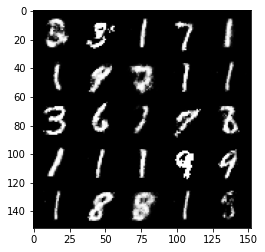

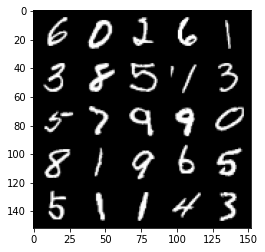

Step 36000: Generator loss: 329.63538093745154, discriminator loss: 13.26959588098628


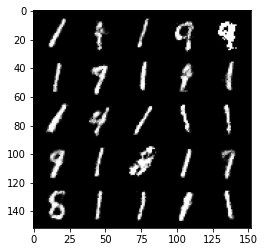

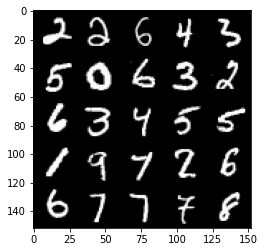

Step 36500: Generator loss: 332.0082814987838, discriminator loss: 13.544024959773855


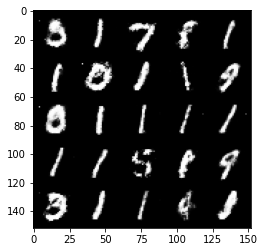

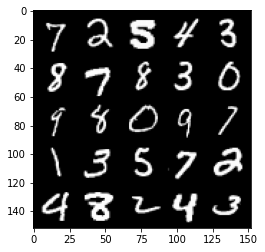

Step 37000: Generator loss: 334.3177174509706, discriminator loss: 13.825514164985256


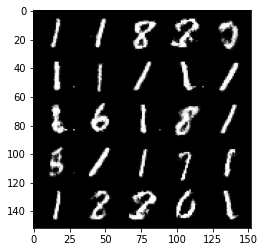

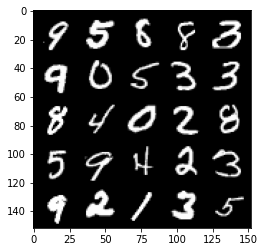

Step 37500: Generator loss: 336.61156312405546, discriminator loss: 14.10834339976413


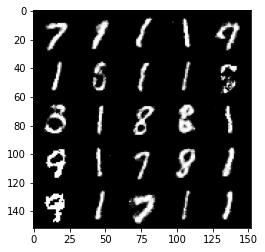

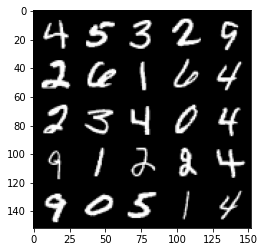

Step 38000: Generator loss: 338.8758852530665, discriminator loss: 14.392689220161277


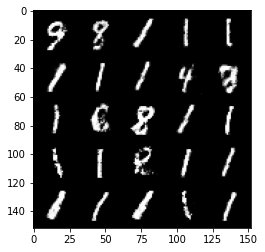

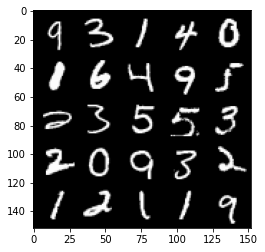

Step 38500: Generator loss: 341.1267165142238, discriminator loss: 14.678795761645862


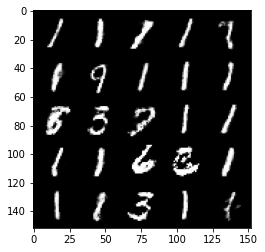

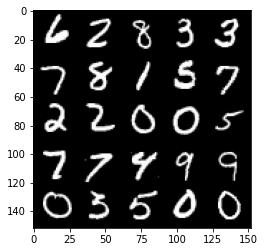

Step 39000: Generator loss: 343.3080513819396, discriminator loss: 14.973683929295367


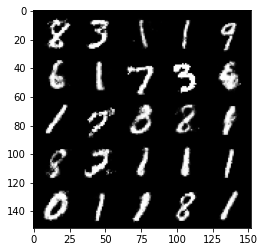

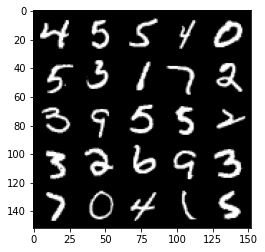

Step 39500: Generator loss: 345.4636792017154, discriminator loss: 15.278846041382383


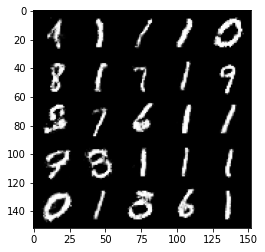

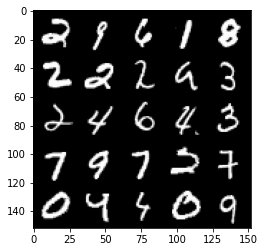

Step 40000: Generator loss: 347.6180490544959, discriminator loss: 15.579841529012752


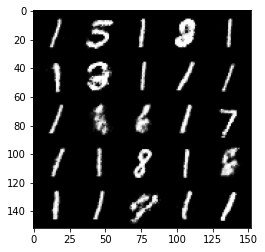

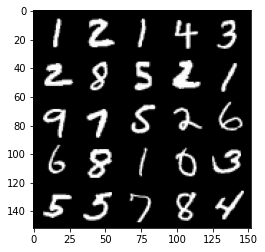

Step 40500: Generator loss: 349.75904677712157, discriminator loss: 15.880144015223818


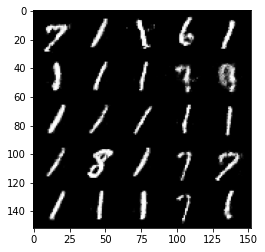

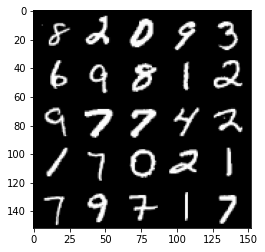

Step 41000: Generator loss: 351.90666637932577, discriminator loss: 16.17874511200293


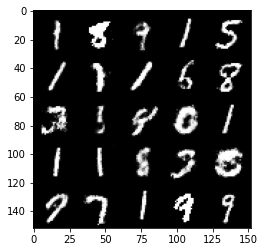

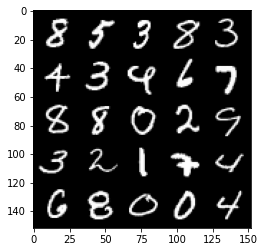

Step 41500: Generator loss: 354.04419985782425, discriminator loss: 16.478617584020956


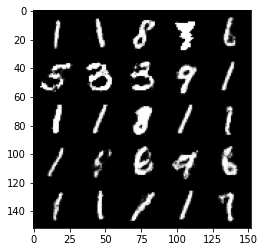

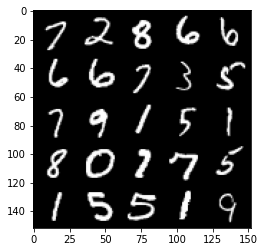

Step 42000: Generator loss: 356.1463149131463, discriminator loss: 16.781615223319395


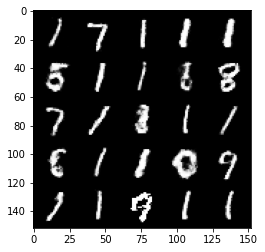

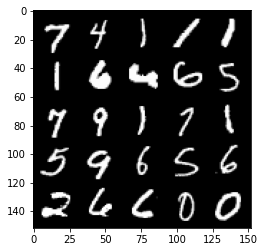

Step 42500: Generator loss: 358.23432856356334, discriminator loss: 17.09240512061224


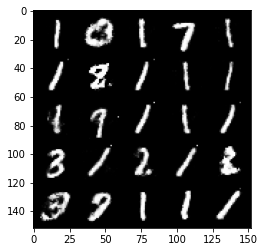

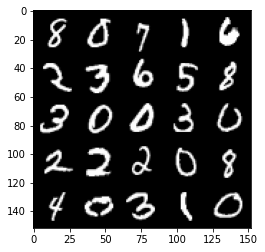

Step 43000: Generator loss: 360.33760707771074, discriminator loss: 17.40328016114337


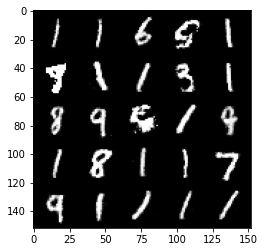

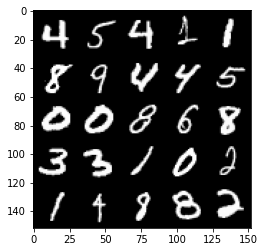

Step 43500: Generator loss: 362.43327343808835, discriminator loss: 17.71617965051631


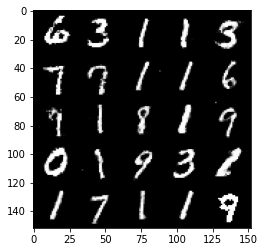

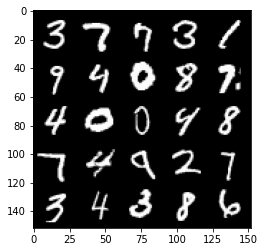

Step 44000: Generator loss: 364.49518886863353, discriminator loss: 18.030165142596726


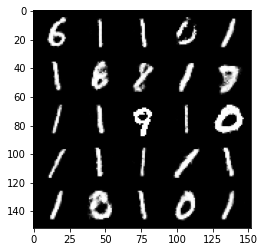

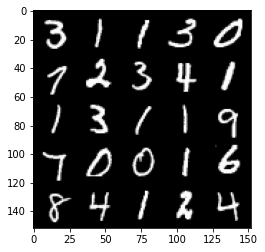

Step 44500: Generator loss: 366.574973720423, discriminator loss: 18.344214811504855


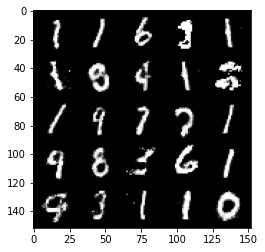

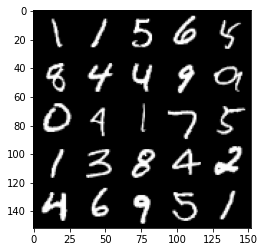

Step 45000: Generator loss: 368.6611622418082, discriminator loss: 18.65269606864547


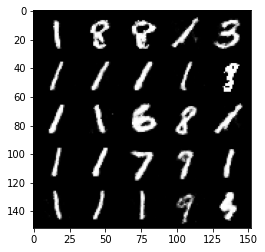

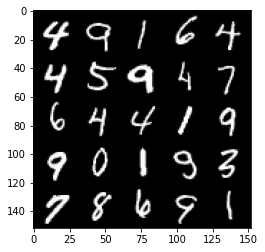

Step 45500: Generator loss: 370.7058048499738, discriminator loss: 18.968795037628208


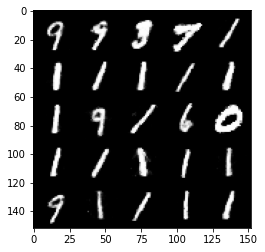

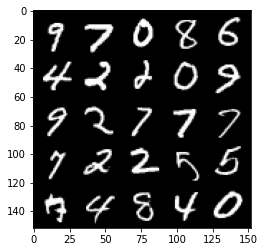

Step 46000: Generator loss: 372.7395546866572, discriminator loss: 19.28727834081747


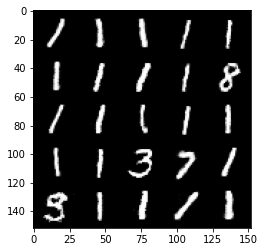

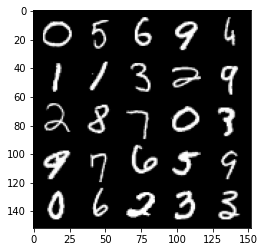

Step 46500: Generator loss: 374.7771226953186, discriminator loss: 19.606037548691965


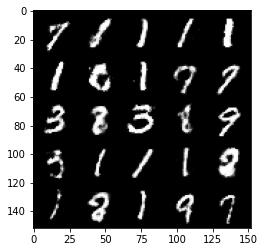

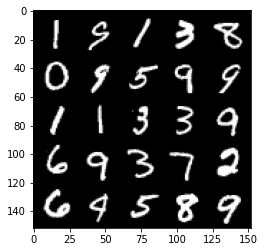

Step 47000: Generator loss: 376.8033953834686, discriminator loss: 19.923294039369548


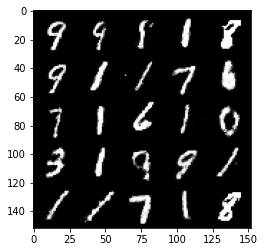

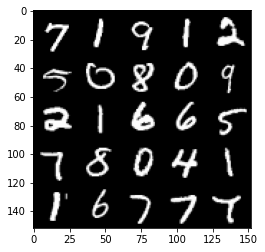

Step 47500: Generator loss: 378.83093692647583, discriminator loss: 20.244912744046182


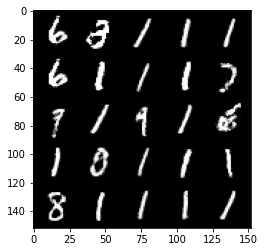

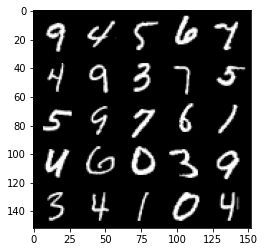

Step 48000: Generator loss: 380.89110373508055, discriminator loss: 20.56147793218583


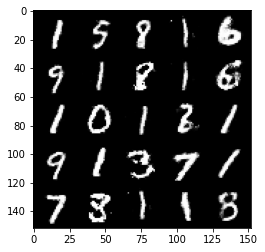

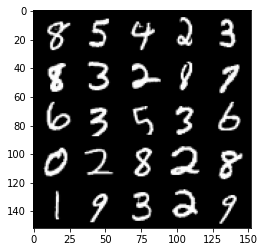

Step 48500: Generator loss: 382.93139931165297, discriminator loss: 20.87954157829375


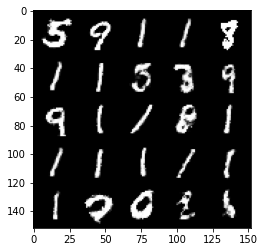

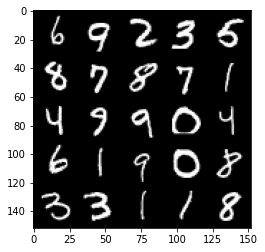

Step 49000: Generator loss: 384.946261755815, discriminator loss: 21.203940307618083


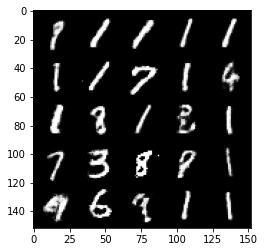

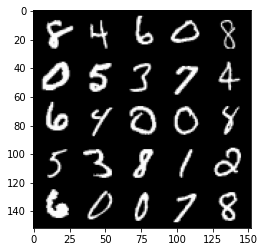

Step 49500: Generator loss: 386.9611742359314, discriminator loss: 21.52730159068196


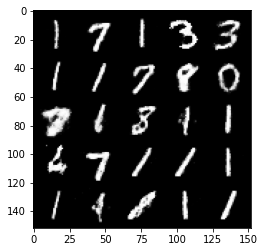

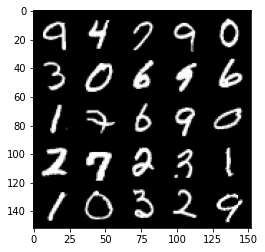

Step 50000: Generator loss: 388.9522777441659, discriminator loss: 21.855341072202624


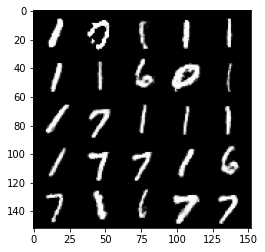

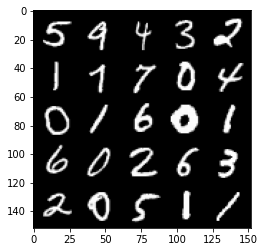

Step 50500: Generator loss: 390.92766708170575, discriminator loss: 22.185742144585568


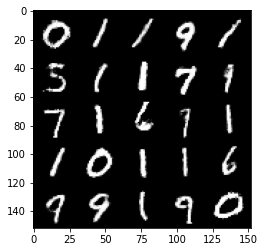

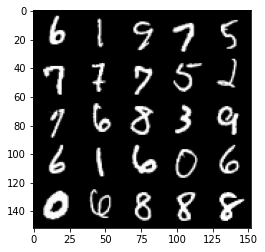

Step 51000: Generator loss: 392.92184612690687, discriminator loss: 22.515508895278913


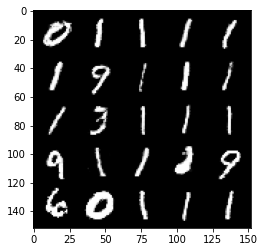

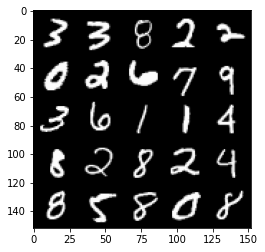

Step 51500: Generator loss: 394.9012208689384, discriminator loss: 22.847310494632442


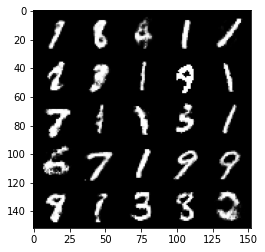

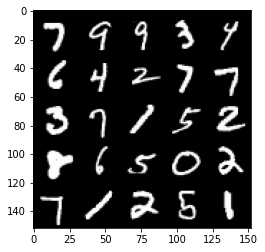

Step 52000: Generator loss: 396.86162350546687, discriminator loss: 23.18295491319986


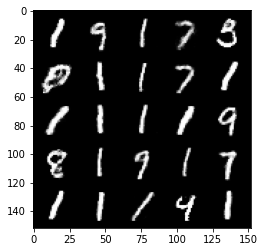

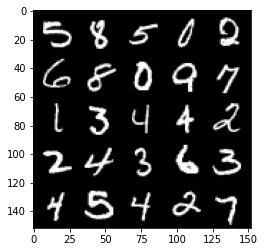

Step 52500: Generator loss: 398.8306237474623, discriminator loss: 23.519431600929227


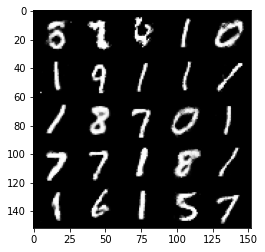

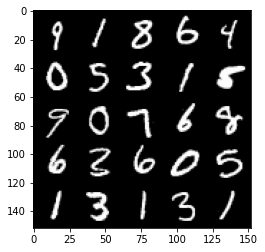

Step 53000: Generator loss: 400.77908320485955, discriminator loss: 23.85915203586313


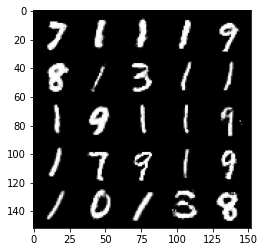

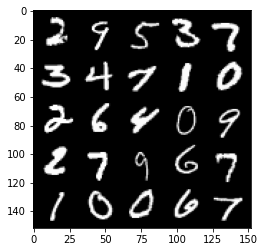

Step 53500: Generator loss: 402.7588544105235, discriminator loss: 24.192027175516785


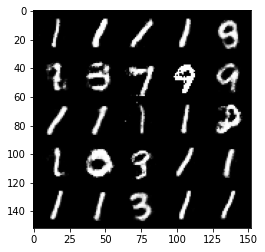

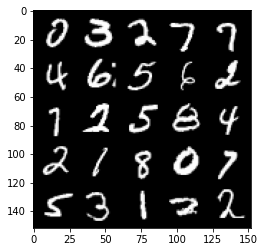

Step 54000: Generator loss: 404.72952389490064, discriminator loss: 24.527491914601036


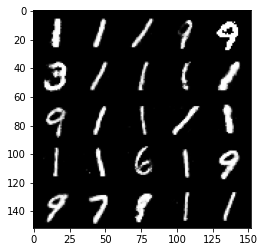

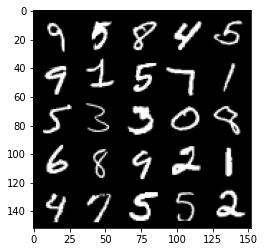

Step 54500: Generator loss: 406.68642467772463, discriminator loss: 24.862508357555537


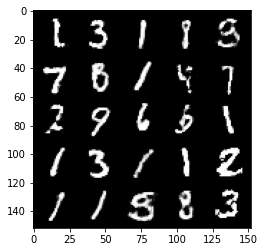

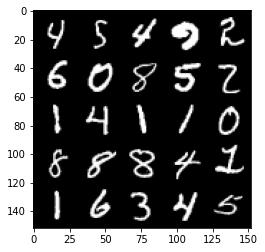

Step 55000: Generator loss: 408.6222811342434, discriminator loss: 25.203338648051897


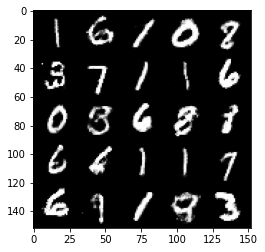

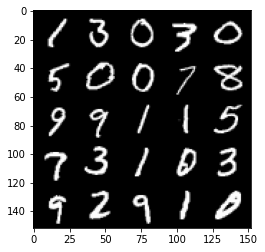

Step 55500: Generator loss: 410.54086832653996, discriminator loss: 25.54573787579026


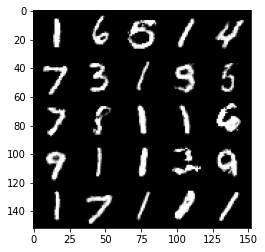

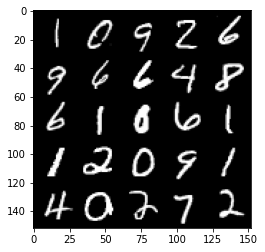

Step 56000: Generator loss: 412.47849125349006, discriminator loss: 25.888418185801154


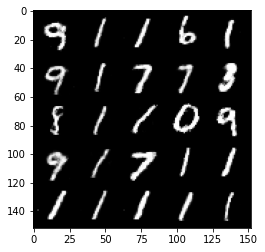

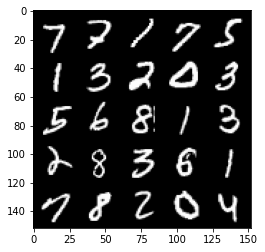

Step 56500: Generator loss: 414.4220867544367, discriminator loss: 26.22839223572694


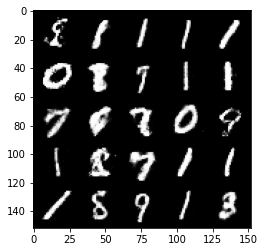

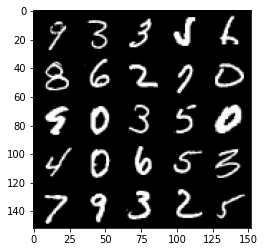

Step 57000: Generator loss: 416.33410979330057, discriminator loss: 26.571786830277034


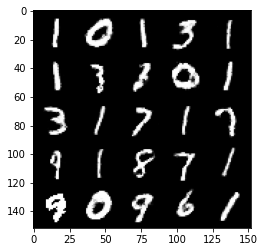

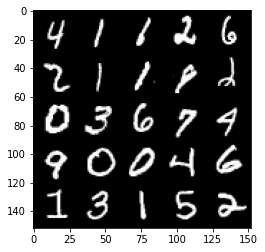

Step 57500: Generator loss: 418.25469725739526, discriminator loss: 26.917653034210975


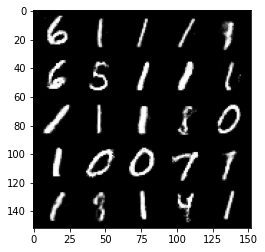

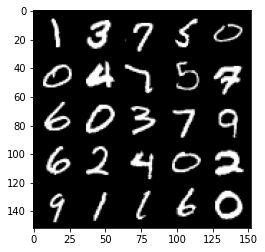

Step 58000: Generator loss: 420.1668108068661, discriminator loss: 27.26089662227113


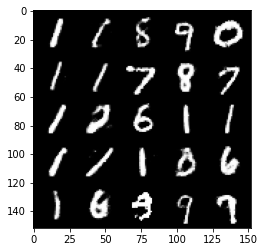

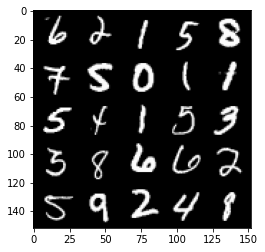

Step 58500: Generator loss: 422.0687829710197, discriminator loss: 27.606661657483162


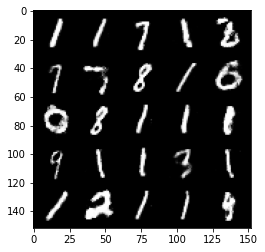

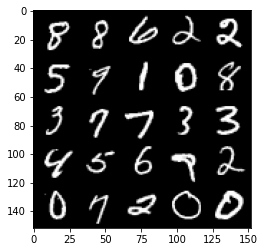

Step 59000: Generator loss: 423.97731260358796, discriminator loss: 27.95326714959819


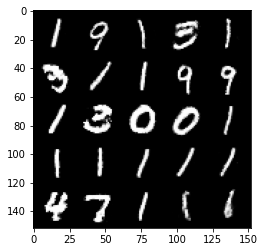

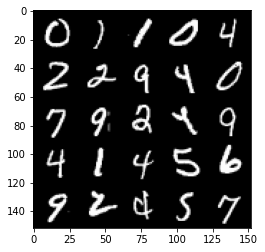

Step 59500: Generator loss: 425.8484625021177, discriminator loss: 28.303932263613515


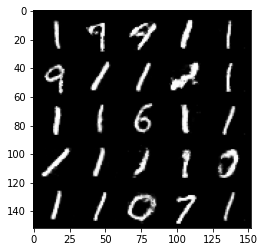

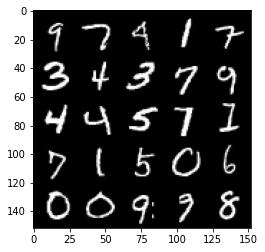

Step 60000: Generator loss: 427.7294768146238, discriminator loss: 28.654734517455882


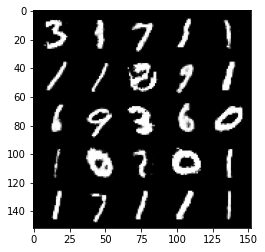

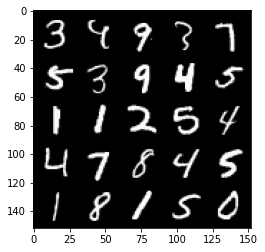

Step 60500: Generator loss: 429.60214361893725, discriminator loss: 29.008127191782794


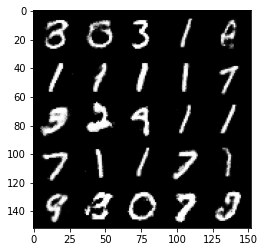

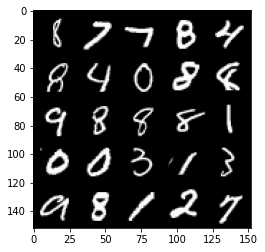

Step 61000: Generator loss: 431.4993408921916, discriminator loss: 29.357876768798413


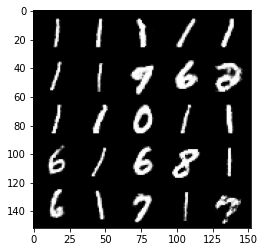

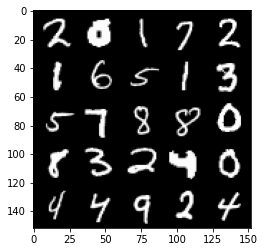

Step 61500: Generator loss: 433.3765273362359, discriminator loss: 29.711274833113738


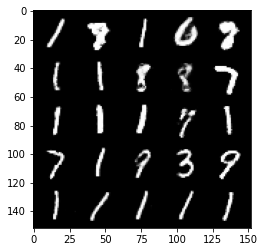

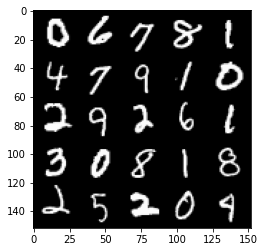

Step 62000: Generator loss: 435.24164919006336, discriminator loss: 30.066909847886162


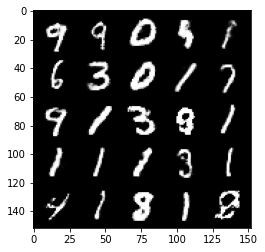

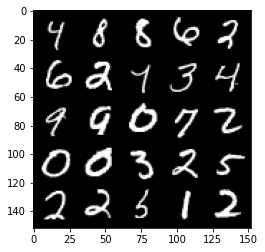

Step 62500: Generator loss: 437.09739980923604, discriminator loss: 30.421751634986002


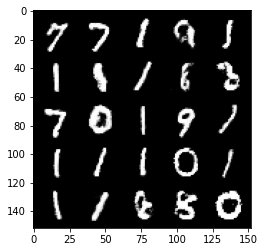

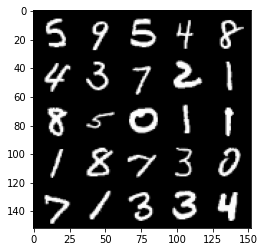

Step 63000: Generator loss: 438.930149994487, discriminator loss: 30.78222029805264


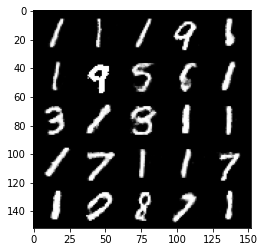

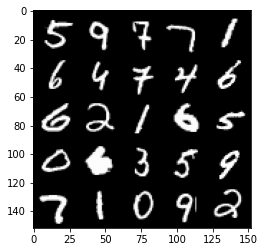

Step 63500: Generator loss: 440.8040670915794, discriminator loss: 31.134040369928705


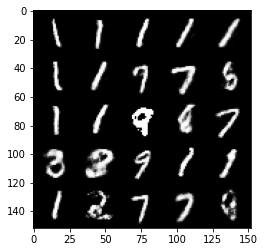

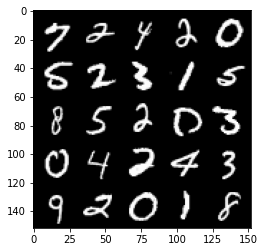

Step 64000: Generator loss: 442.65032921230335, discriminator loss: 31.494800754488335


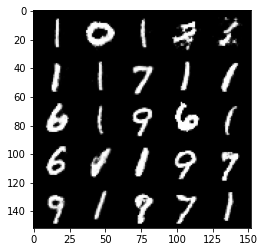

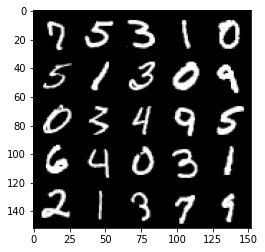

Step 64500: Generator loss: 444.50638961874984, discriminator loss: 31.853385634929797


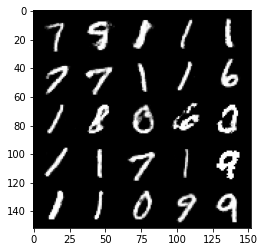

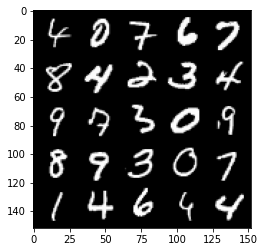

Step 65000: Generator loss: 446.34677947103546, discriminator loss: 32.21812940535047


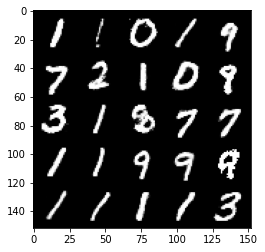

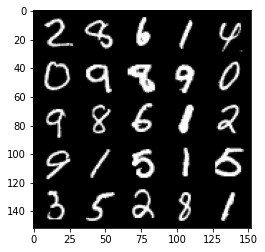

Step 65500: Generator loss: 448.1821707581235, discriminator loss: 32.58082893517715


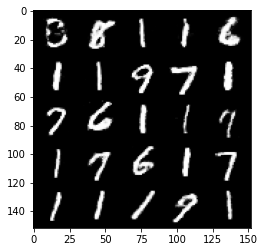

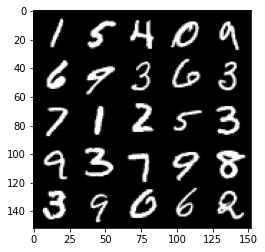

Step 66000: Generator loss: 450.0333391915508, discriminator loss: 32.94275014123412


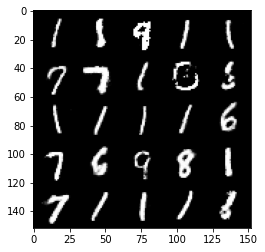

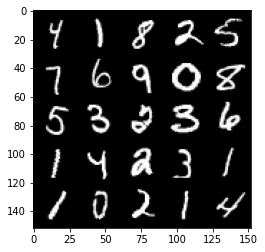

Step 66500: Generator loss: 451.84809778367963, discriminator loss: 33.3092345709809


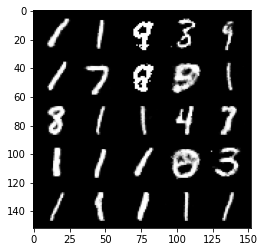

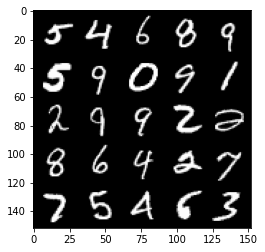

Step 67000: Generator loss: 453.6591600502681, discriminator loss: 33.67607731306632


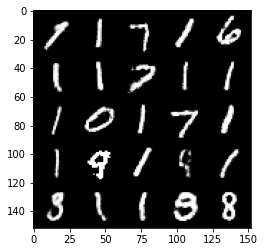

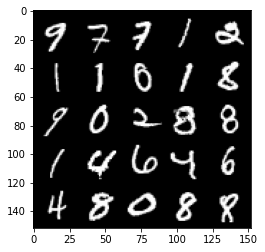

Step 67500: Generator loss: 455.4930937446302, discriminator loss: 34.04328952074131


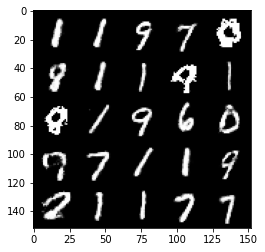

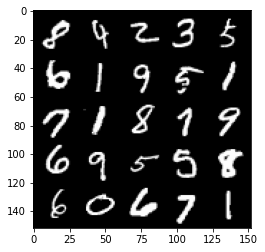

Step 68000: Generator loss: 457.33516662346767, discriminator loss: 34.40559166717607


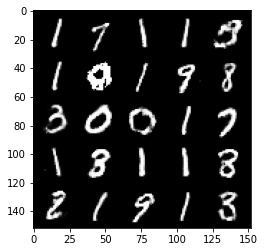

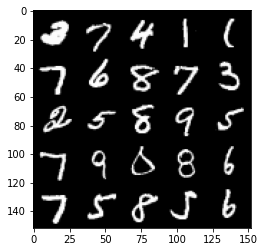

Step 68500: Generator loss: 459.16703998696255, discriminator loss: 34.771966243148675


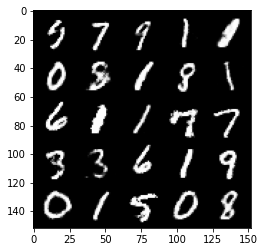

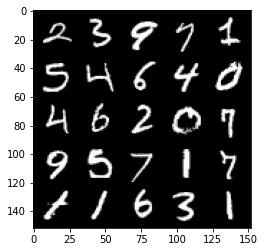

Step 69000: Generator loss: 461.0056769653501, discriminator loss: 35.13804997742262


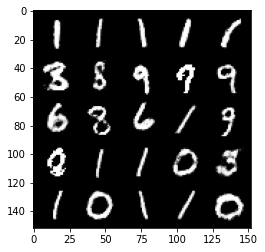

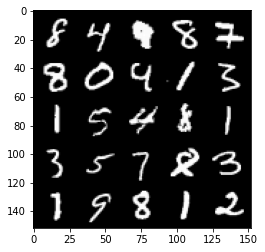

Step 69500: Generator loss: 462.83058118760016, discriminator loss: 35.50337978464454


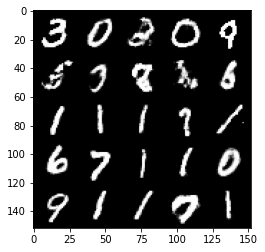

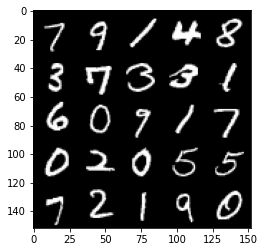

Step 70000: Generator loss: 464.65934234487526, discriminator loss: 35.87352476459822


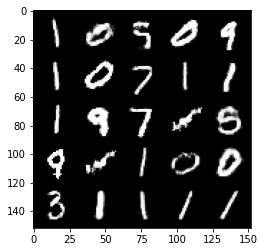

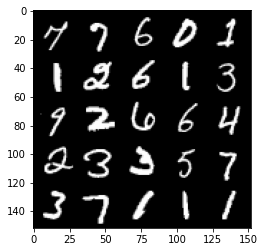

Step 70500: Generator loss: 466.4768738950437, discriminator loss: 36.238260599256456


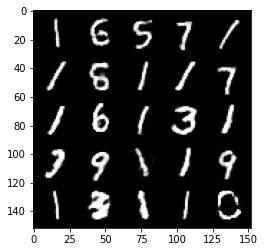

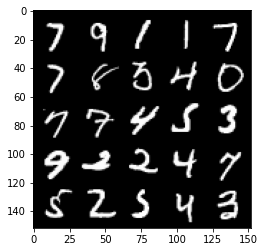

Step 71000: Generator loss: 468.3008743718807, discriminator loss: 36.60401800832247


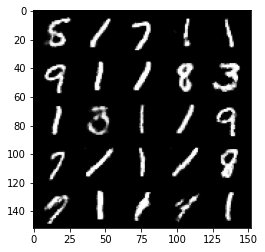

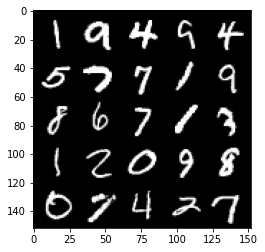

Step 71500: Generator loss: 470.1195065764136, discriminator loss: 36.96705076620081


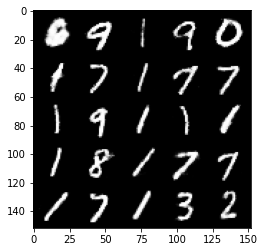

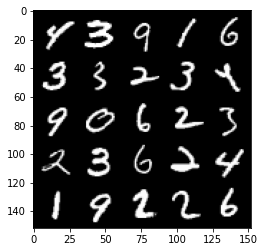

Step 72000: Generator loss: 471.95430774866986, discriminator loss: 37.332384408027906


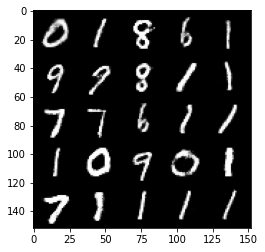

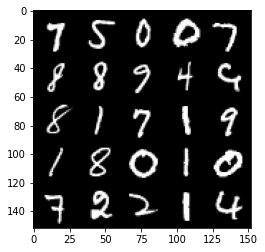

Step 72500: Generator loss: 473.7913683236783, discriminator loss: 37.69495914217929


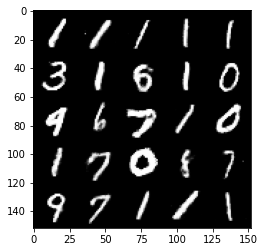

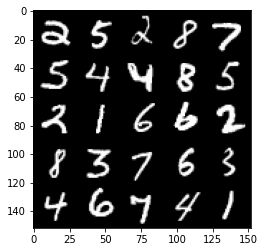

Step 73000: Generator loss: 475.61704454934005, discriminator loss: 38.05767502501707


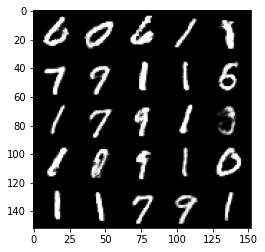

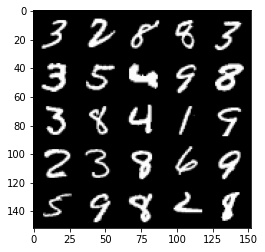

Step 73500: Generator loss: 477.4321080816924, discriminator loss: 38.421008902520946


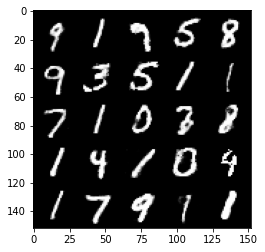

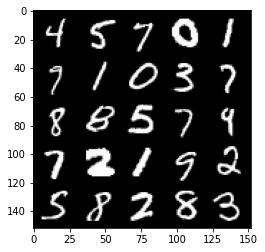

Step 74000: Generator loss: 479.26024490534746, discriminator loss: 38.78301612928611


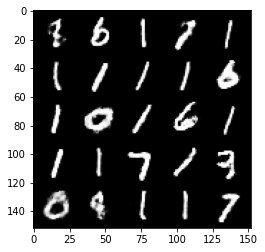

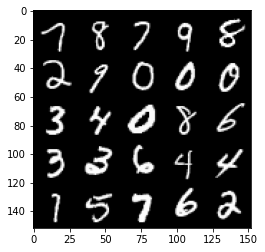

Step 74500: Generator loss: 481.0739955083082, discriminator loss: 39.148263835222515


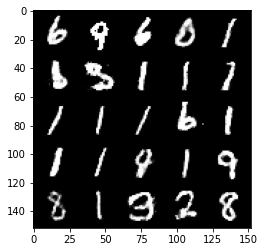

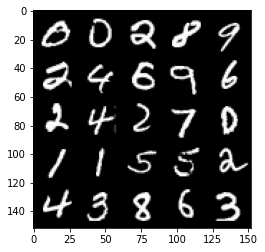

Step 75000: Generator loss: 482.8868239082048, discriminator loss: 39.51626504817704


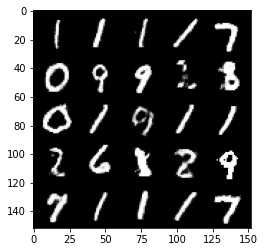

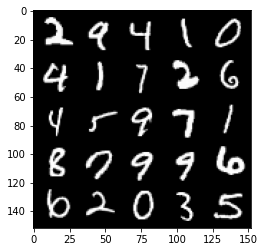

Step 75500: Generator loss: 484.676860035295, discriminator loss: 39.890513820261745


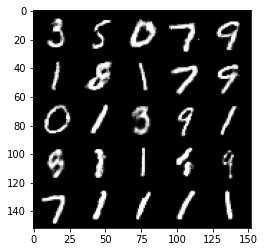

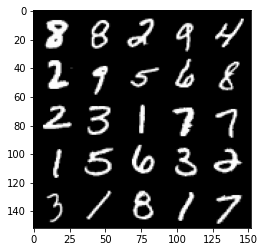

Step 76000: Generator loss: 486.4863892902083, discriminator loss: 40.26178822556235


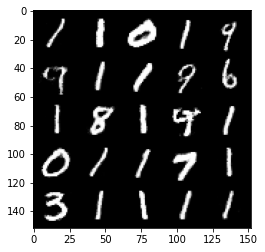

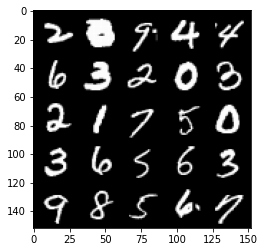

Step 76500: Generator loss: 488.3119540418329, discriminator loss: 40.62888263639905


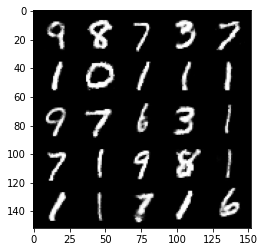

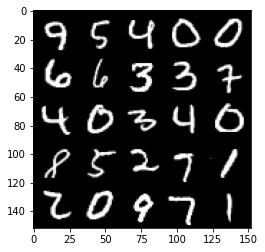

Step 77000: Generator loss: 490.1520500851809, discriminator loss: 40.99780635306332


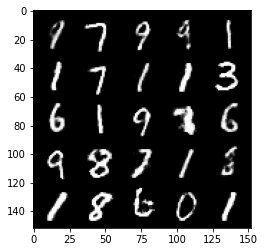

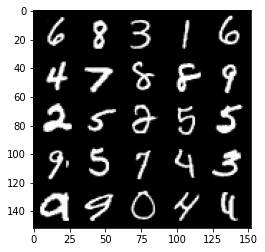

Step 77500: Generator loss: 491.99170466601197, discriminator loss: 41.36464984259102


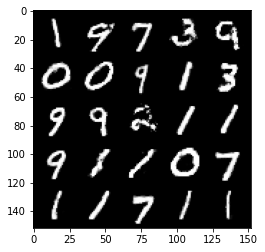

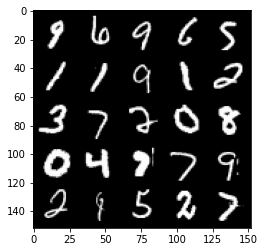

Step 78000: Generator loss: 493.81504809438513, discriminator loss: 41.73187980958905


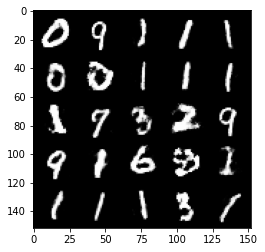

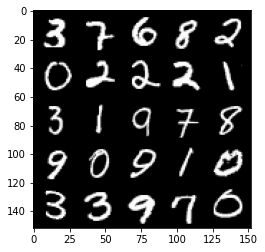

Step 78500: Generator loss: 495.62445351683397, discriminator loss: 42.10138745251386


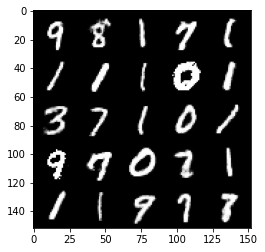

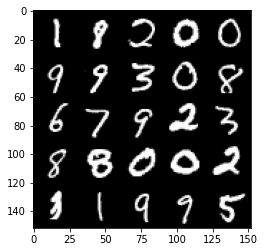

Step 79000: Generator loss: 497.4252100895573, discriminator loss: 42.472572626025325


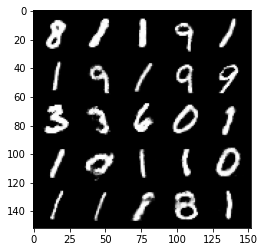

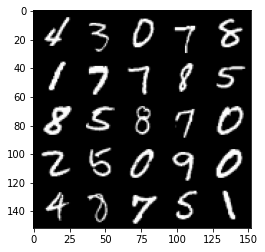

Step 79500: Generator loss: 499.24219017087734, discriminator loss: 42.84083479151206


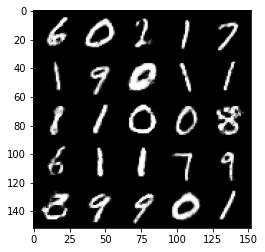

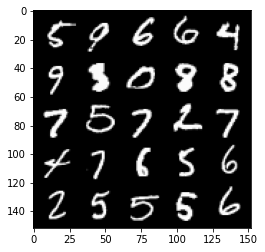

Step 80000: Generator loss: 501.0518665872742, discriminator loss: 43.209940993458844


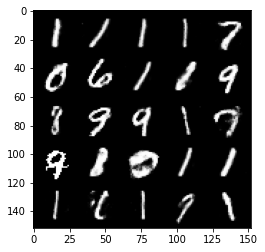

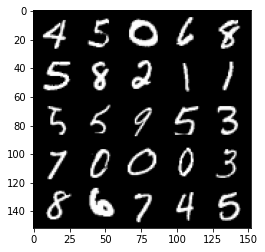

Step 80500: Generator loss: 502.87888082563137, discriminator loss: 43.57427028861718


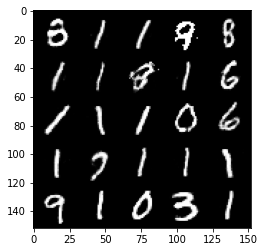

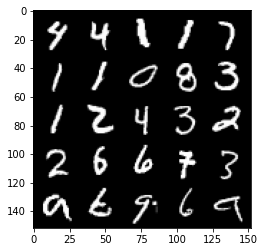

Step 81000: Generator loss: 504.71353039156736, discriminator loss: 43.93867948713966


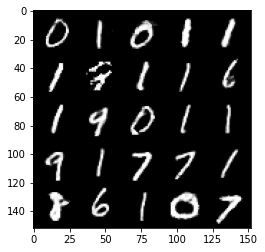

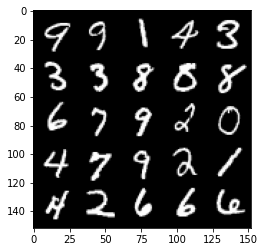

Step 81500: Generator loss: 506.5214554487396, discriminator loss: 44.306664006025315


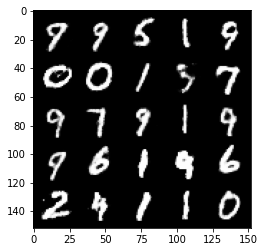

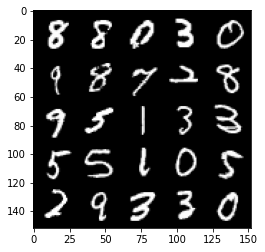

Step 82000: Generator loss: 508.331435144774, discriminator loss: 44.67308308723633


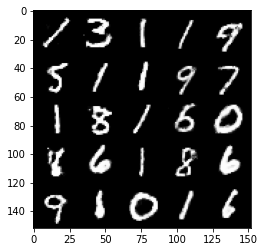

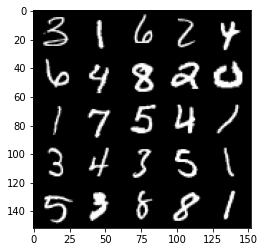

Step 82500: Generator loss: 510.15514185868903, discriminator loss: 45.03551763948868


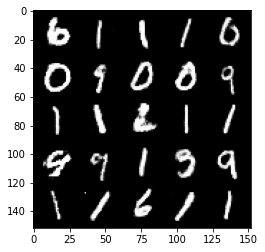

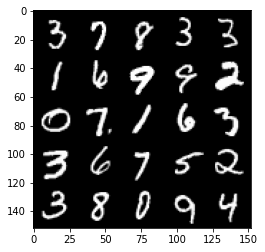

Step 83000: Generator loss: 511.9553515559356, discriminator loss: 45.40865864446838


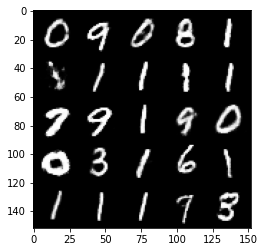

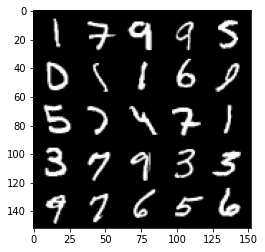

Step 83500: Generator loss: 513.7698660398639, discriminator loss: 45.775000760705076


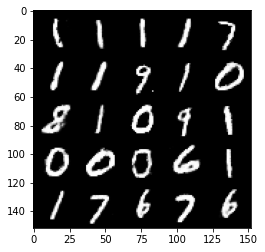

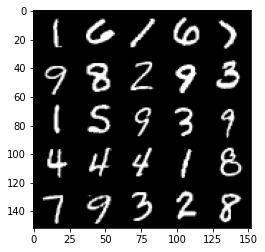

Step 84000: Generator loss: 515.589044968478, discriminator loss: 46.14210807076177


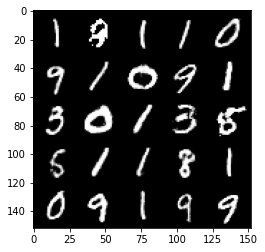

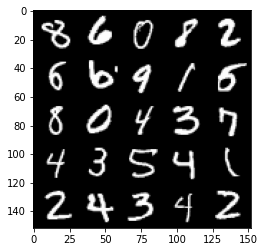

Step 84500: Generator loss: 517.4157866150069, discriminator loss: 46.506924643010656


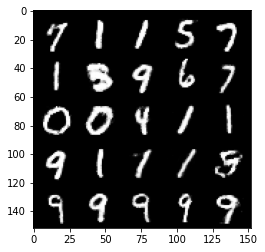

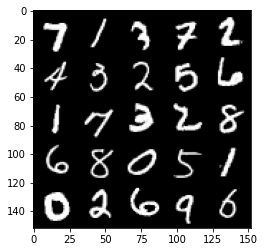

Step 85000: Generator loss: 519.2404400433232, discriminator loss: 46.870336099774356


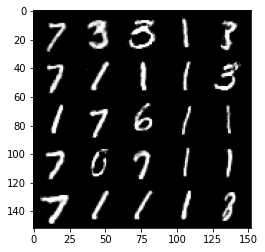

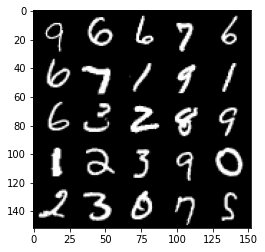

Step 85500: Generator loss: 521.0594344679047, discriminator loss: 47.234686669916655


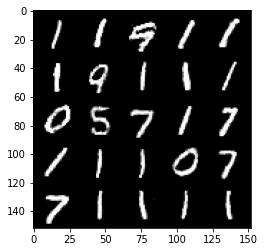

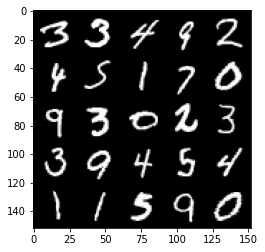

Step 86000: Generator loss: 522.8674947119888, discriminator loss: 47.60032340303144


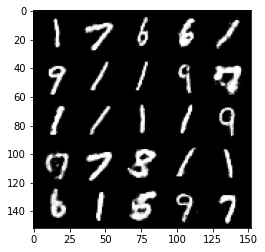

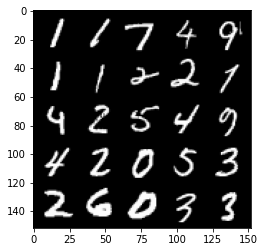

Step 86500: Generator loss: 524.6878580220862, discriminator loss: 47.96801788154327


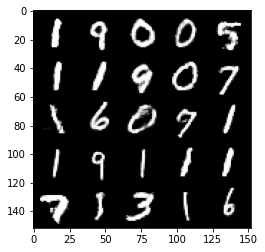

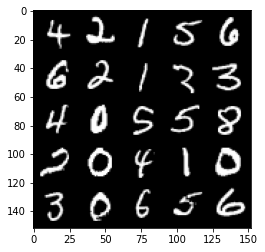

Step 87000: Generator loss: 526.5159371572643, discriminator loss: 48.32963947478017


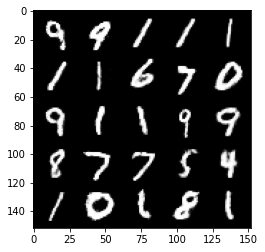

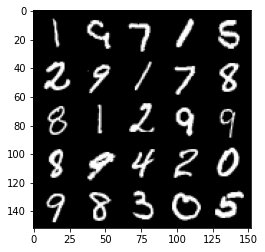

Step 87500: Generator loss: 528.3303127986103, discriminator loss: 48.69303372624601


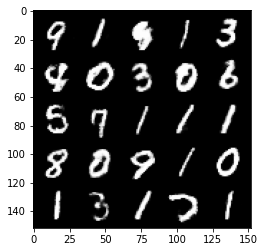

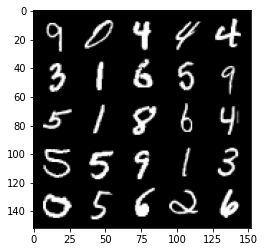

Step 88000: Generator loss: 530.1471629232065, discriminator loss: 49.06202059188567


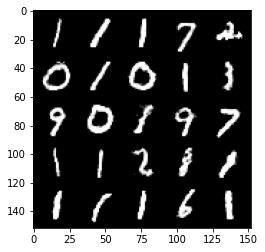

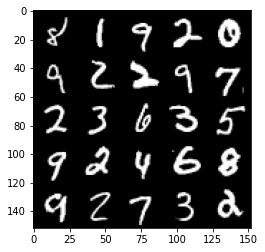

Step 88500: Generator loss: 531.9659283405445, discriminator loss: 49.42616630229438


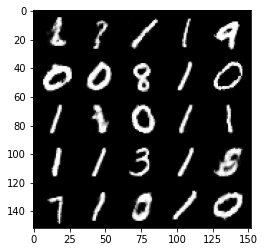

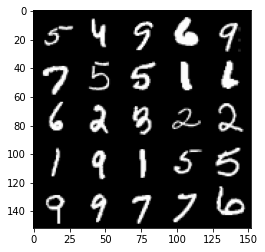

Step 89000: Generator loss: 533.7860496693759, discriminator loss: 49.792142352850014


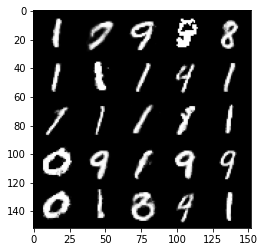

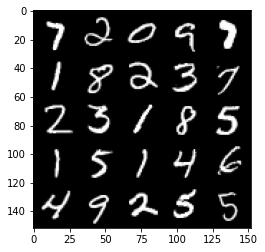

Step 89500: Generator loss: 535.5909911130576, discriminator loss: 50.15648641291334


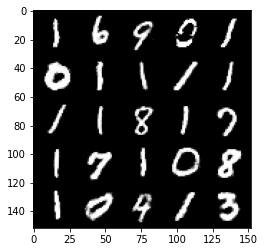

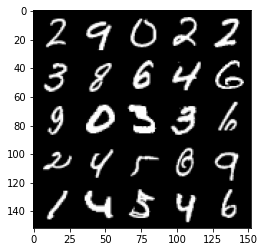

Step 90000: Generator loss: 537.4304881518991, discriminator loss: 50.519079405338296


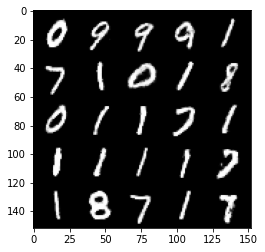

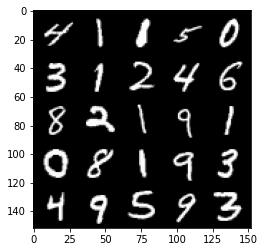

Step 90500: Generator loss: 539.2590509318021, discriminator loss: 50.8845967348524


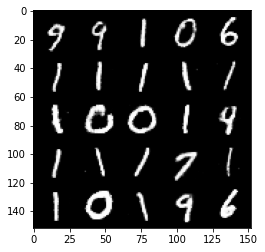

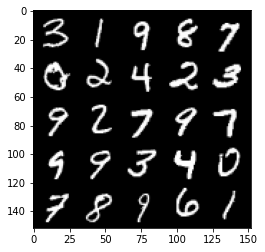

Step 91000: Generator loss: 541.0876540714409, discriminator loss: 51.24930367669534


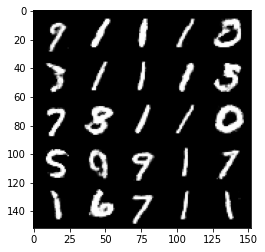

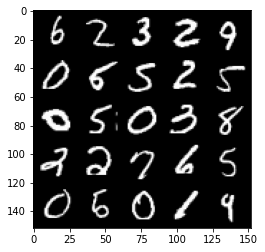

Step 91500: Generator loss: 542.9250342878008, discriminator loss: 51.60930085954145


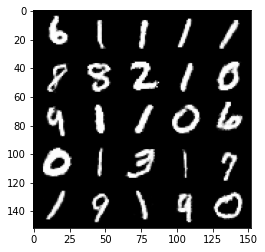

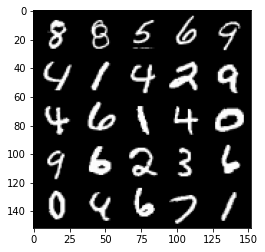

Step 92000: Generator loss: 544.7839671269558, discriminator loss: 51.967248182029266


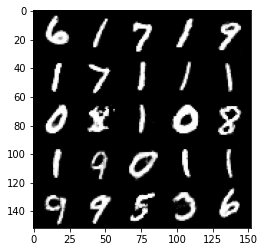

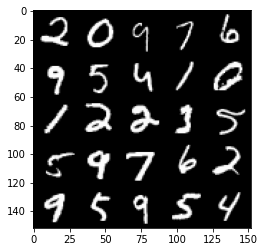

Step 92500: Generator loss: 546.6294237300068, discriminator loss: 52.32741938468886


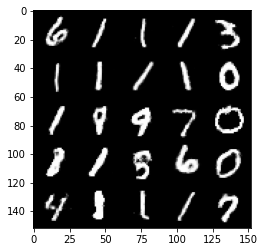

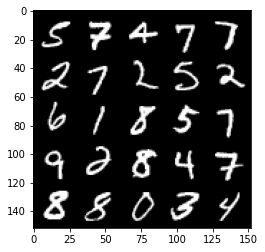

Step 93000: Generator loss: 548.4740495992814, discriminator loss: 52.68921792593674


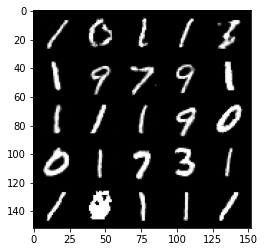

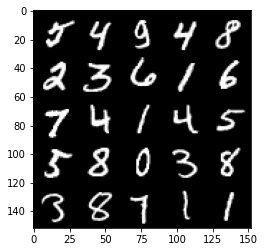

Step 93500: Generator loss: 550.3140027297642, discriminator loss: 53.049332347483215


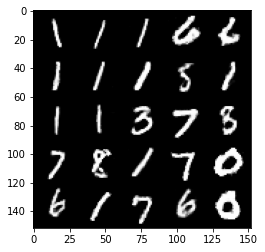

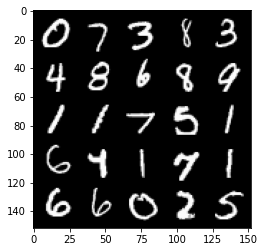

In [14]:
mean_gen_loss = 0.
mean_disc_loss = 0.
display_step = 500
cur_step = 0

for i in range(n_epochs):
    for real,_ in tqdm(dls):
        num_images = len(real)
        real = real.flatten(start_dim=1).to(device)
        disc_opt.zero_grad()
        disc_loss = get_disc_loss(gen,disc,num_images,real,z_dim,device)
        disc_loss.backward(retain_graph=True)
        disc_opt.step()

        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen,disc,num_images,z_dim,device)
        gen_loss.backward()
        gen_opt.step()
        
        mean_gen_loss += gen_loss.item()/display_step
        mean_disc_loss += disc_loss.item()/display_step

        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_gen_loss}, discriminator loss: {mean_disc_loss}")
            fake_noise = get_noise(num_images, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1




        